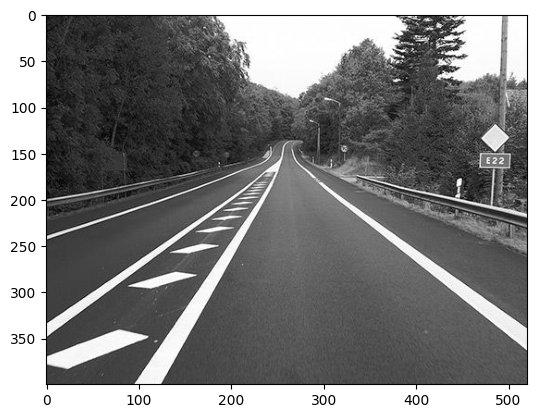

In [1]:
# a) Proszę wczytać przykładowy obraz lab5_1.jpg i skonwertować go do obrazu w skali szarości.

import cv2
from matplotlib import pyplot as plt

image_bgr = cv2.imread("res/lab5_1.jpg")
image = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)

# plt.rcParams["figure.figsize"] = [20, 10]
plt.imshow(image, cmap="gray")


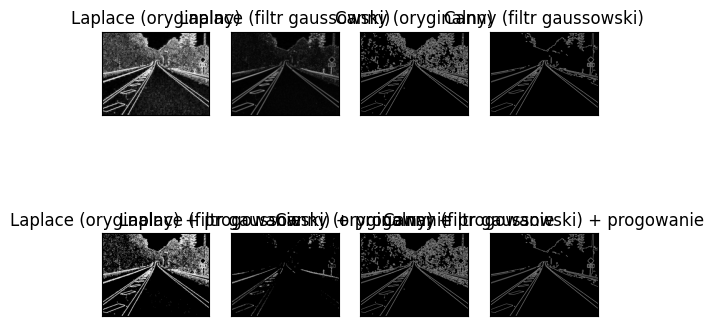

In [2]:
# b) Proszę sprawdzić i porównać wynik wykrywania krawędzi metodami:
#       a. Laplace
#       b. Canny
# dla obrazu oryginalnego i obrazu z nałożonym filtrem gaussowskim (5x5). Wynikowy obraz można poddać progowaniu.

image_gauss = cv2.GaussianBlur(image, (5, 5), 0)

# wykrywanie krawedzi metoda Laplace
dst1 = cv2.Laplacian(image, cv2.CV_16S, ksize=3)
dst1g = cv2.Laplacian(image_gauss, cv2.CV_16S, ksize=3)

# wykrywanie krawedzi metoda Canny
dst2 = cv2.Canny(image, 100, 200)
dst2g = cv2.Canny(image_gauss, 100, 200)

# konwersja spowrotem z CV_16S na CV_8U i
dst11 = cv2.convertScaleAbs(dst1)
dst11g = cv2.convertScaleAbs(dst1g)
dst22 = cv2.convertScaleAbs(dst2)
dst22g = cv2.convertScaleAbs(dst2g)


# poddanie progowaniu przy pomocy THRESH_BINARY
_, abs_dst1 = cv2.threshold(cv2.convertScaleAbs(dst11), 127, 255, cv2.THRESH_BINARY)
_, abs_dst1g = cv2.threshold(cv2.convertScaleAbs(dst11g), 127, 255, cv2.THRESH_BINARY)
_, abs_dst2 = cv2.threshold(cv2.convertScaleAbs(dst22), 127, 255, cv2.THRESH_BINARY)
_, abs_dst2g = cv2.threshold(cv2.convertScaleAbs(dst22g), 127, 255, cv2.THRESH_BINARY)

# wyswietlanie wynikow wykrywania krawedzi
titles = [
    "Laplace (oryginalny)",
    "Laplace (filtr gaussowski)",
    "Canny (oryginalny)",
    "Canny (filtr gaussowski)",
    "Laplace (oryginalny) + progowanie",
    "Laplace (filtr gaussowski) + progowanie",
    "Canny (oryginalny) + progowanie",
    "Canny (filtr gaussowski) + progowanie",
]
images = [
    dst11,
    dst11g,
    dst22,
    dst22g,
    abs_dst1,
    abs_dst1g,
    abs_dst2,
    abs_dst2g,
]

for i in range(8):
    plt.subplot(2, 4, i + 1)
    plt.imshow(images[i], "gray")
    plt.title(titles[i])
    plt.xticks([]), plt.yticks([])

plt.show()


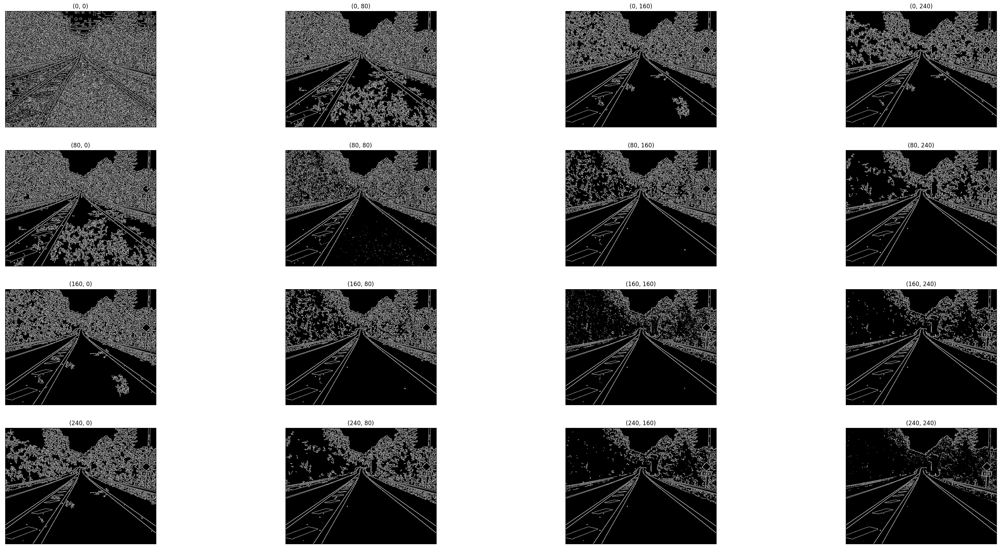

In [3]:
# c) Proszę zbadać wpływ parametrów minVal, maxVal i kSize na wynik działania algorytmu Canny
vals = [0, 80, 160, 240]
res = {}
for min_val in vals:
    for max_val in vals:
        can = cv2.Canny(image, min_val, max_val)
        title = str((min_val, max_val))
        res[title] = can

plt.rcParams["figure.figsize"] = [40, 20]
i = 0
for key, img in res.items():
    plt.subplot(4, 4, i + 1)
    plt.imshow(img, "gray", vmin=0, vmax=255)
    plt.title(key)
    plt.xticks([]), plt.yticks([])
    i += 1

plt.show()

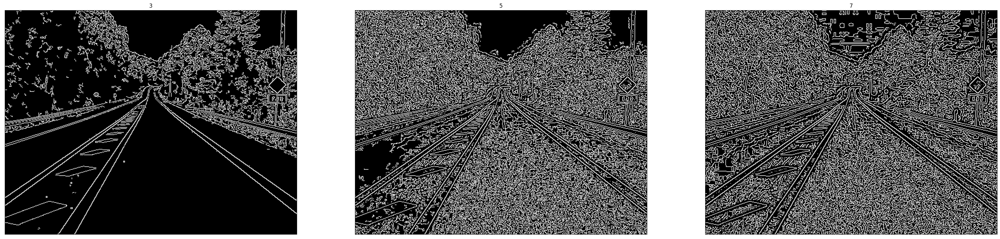

In [4]:
# wpływ parametrów kSize na wynik działania algorytmu Canny
vals = [3, 5, 7]
res = {}
for val in vals:
    can = cv2.Canny(image, 100, 200, apertureSize=val)
    res[val] = can

plt.rcParams["figure.figsize"] = [40, 20]
i = 0
for key, img in res.items():
    plt.subplot(1, 3, i + 1)
    plt.imshow(img, "gray", vmin=0, vmax=255)
    plt.title(key)
    plt.xticks([]), plt.yticks([])
    i += 1

plt.show()


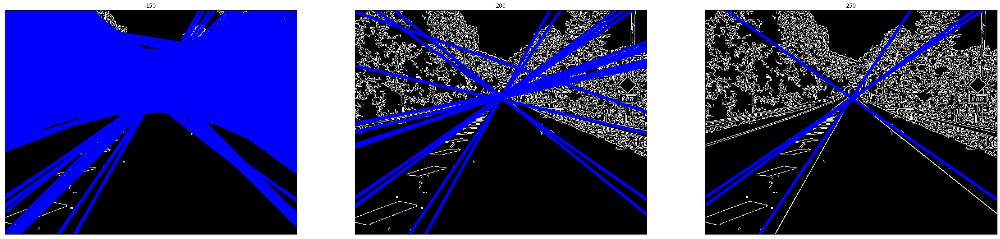

In [5]:
# d) e) Proszę dokonać wykrywania linii metodą transformacji Hough
import math
import numpy as np

dst = cv2.Canny(image, 50, 200, None, 3)

vals = [150, 200, 250]
res = {}
for val in vals:
    cdst = cv2.cvtColor(dst, cv2.COLOR_GRAY2BGR)
    cdstP = np.copy(cdst)

    lines = cv2.HoughLines(dst, 1, np.pi / 180, val, None, 0, 0)

    if lines is not None:
        for i in range(0, len(lines)):
            rho = lines[i][0][0]
            theta = lines[i][0][1]
            a = math.cos(theta)
            b = math.sin(theta)
            x0 = a * rho
            y0 = b * rho
            pt1 = (int(x0 + 1000 * (-b)), int(y0 + 1000 * (a)))
            pt2 = (int(x0 - 1000 * (-b)), int(y0 - 1000 * (a)))
            cv2.line(cdst, pt1, pt2, (0, 0, 255), 3, cv2.LINE_AA)
    res[val] = cdst

i = 0
for key, img in res.items():
    plt.subplot(1, 3, i + 1)
    plt.imshow(img, "gray", vmin=0, vmax=255)
    plt.title(key)
    plt.xticks([]), plt.yticks([])
    i += 1

plt.show()

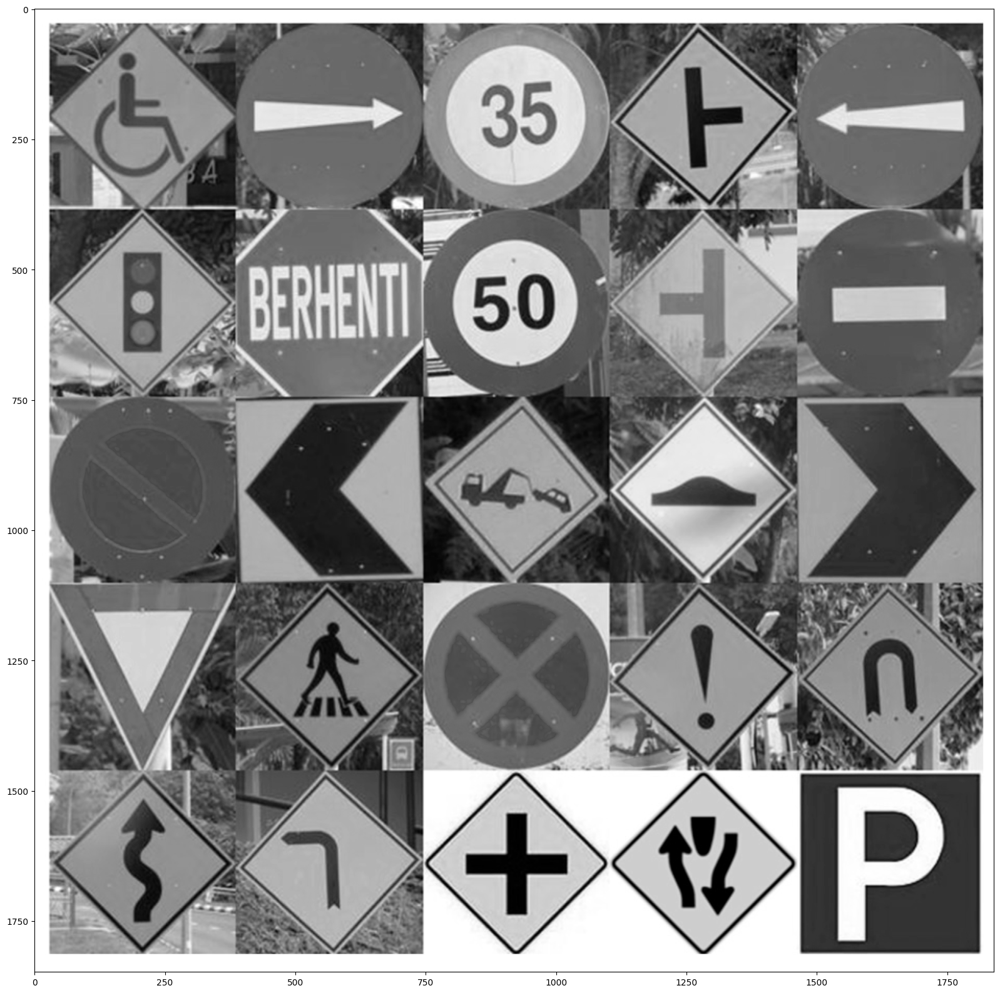

In [6]:
# f) Proszę wczytać drugi z przykładowych obrazów lab5_2.png, podobnie go skonwertować i dokonać wykrywania okręgów.
import cv2
from matplotlib import pyplot as plt

# wczytanie
image_bgr = cv2.imread("res/lab5_2.png")
image = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)

# plt.rcParams["figure.figsize"] = [20, 10]
plt.imshow(image, cmap="gray")

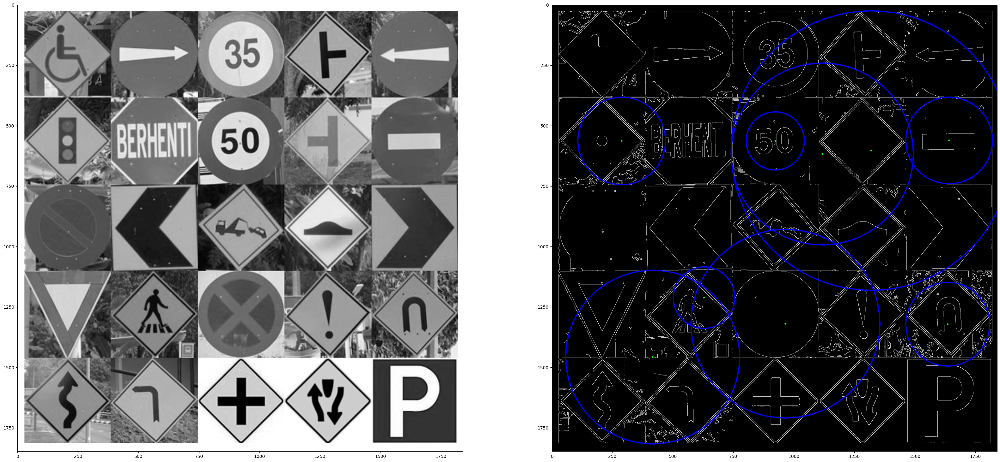

In [22]:
dst = cv2.Canny(image, 50, 200, None, 3)

# Copy edges to the images that will display the results in BGR
cdst = cv2.cvtColor(dst, cv2.COLOR_GRAY2BGR)

lines = cv2.HoughCircles(
    dst, cv2.HOUGH_GRADIENT, 1, 200, param1=50, param2=140, minRadius=0, maxRadius=0
)

if lines is not None:
    lines = np.uint16(np.around(lines))
    for i in lines[0, :]:
        cv2.circle(cdst, (i[0], i[1]), i[2], (0, 0, 255), 3)
        cv2.circle(cdst, (i[0], i[1]), 2, (0, 255, 0), 3)

plt.subplot(1, 2, 1)
plt.imshow(image, "gray")
plt.subplot(1, 2, 2)
plt.imshow(cdst)
